# MixTastic - simple audio engineering for beginner musicians



## PART 1: Data ETL

This section of the notebook is for extracting the MUSDB18-HQ dataset, transforming it by adding augmentations that simulate dry stems from the wet stems in the dataset, and then loading into Google Drive. Run this with a CPU runtime, because none of this requires a GPU and you don't want to waste your credits (it runs for more than an hour).

### Extracting the MUSDB18-HQ Dataset into Google Drive

In [ ]:
!pip install kagglehub

import os
from google.colab import drive
import kagglehub

# Download latest version
path = kagglehub.dataset_download("quanglvitlm/musdb18-hq")

print("Path to dataset files:", path)

# Mount Google Drive
drive.mount('/content/drive')


In [ ]:
import shutil

# Source and destination paths
source_folder = path
destination_folder = '/content/drive/My Drive/mixtastic/' # Replace with desired destination

# Check if the source folder exists
if os.path.exists(source_folder):
    # Move the folder
    try:
        shutil.move(source_folder, destination_folder)
        print(f"Folder '{source_folder}' moved to '{destination_folder}' successfully.")
    except shutil.Error as e:
        print(f"Error moving the folder: {e}")
else:
    print(f"Source folder '{source_folder}' does not exist.")

In [ ]:
from google.colab import drive
drive.flush_and_unmount()

### Transforming the MUSDB18-HQ Dataset using augmentations

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
!mkdir -p /content/data
!cp -r /content/drive/MyDrive/mixtastic/musdb18hq /content/data/

In [ ]:
!pip install audiomentations soundfile numpy==1.24.4 pyroomacoustics pydub numba==0.58.0

In [ ]:
import os
import random
import numpy as np
import soundfile as sf
from pathlib import Path
from tqdm import tqdm
import audiomentations as A
import logging
import traceback
from typing import List, Dict, Optional, Union
import shutil

# Set up logging
logging.basicConfig(
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s',
    handlers=[
        logging.FileHandler('transform.log'),
        logging.StreamHandler()
    ]
)

def calculate_rms(samples: np.ndarray) -> float:
    """Calculate the RMS value of the audio samples."""
    return np.sqrt(np.mean(np.square(samples)))

def convert_decibels_to_amplitude_ratio(decibels: float) -> float:
    """Convert decibels to amplitude ratio."""
    return 10 ** (decibels / 20)

def add_short_noises_multi_channel(
    samples: np.ndarray,
    sample_rate: int,
    sounds_path: str = "noises/",
    min_snr_db: float = 3.0,
    max_snr_db: float = 30.0,
    noise_rms: str = "relative_to_whole_input",
    min_time_between_sounds: float = 2.0,
    max_time_between_sounds: float = 8.0,
    p: float = 0.5
) -> np.ndarray:
    """Custom implementation of AddShortNoises that supports multi-channel audio."""
    if random.random() > p:
        return samples

    # Convert input to float32 to avoid audiomentations warning
    samples = samples.astype(np.float32)

    # Load noise files
    noise_files = list(Path(sounds_path).glob("*.wav"))
    if not noise_files:
        return samples

    # Calculate number of sounds to add
    duration = samples.shape[-1] / sample_rate
    current_time = 0
    sounds: List[Dict] = []

    while current_time < duration:
        # Select a random noise file
        sound_file_path = str(random.choice(noise_files))

        # Load the noise file (soundfile format: samples, channels)
        noise_samples, noise_sample_rate = sf.read(sound_file_path)
        if len(noise_samples.shape) == 1:
            noise_samples = noise_samples[:, np.newaxis]  # Convert to 2D if mono

        # Convert noise to float32
        noise_samples = noise_samples.astype(np.float32)

        # Transpose to (channels, samples) format for audiomentations
        noise_samples = noise_samples.T

        # Ensure noise has same number of channels as input
        if noise_samples.shape[0] != samples.shape[0]:
            noise_samples = np.tile(noise_samples[0:1, :], (samples.shape[0], 1))

        sound_duration = noise_samples.shape[1] / noise_sample_rate

        # Add fade in/out
        fade_in_time = min(0.1, sound_duration / 2)
        fade_out_time = min(0.1, sound_duration / 2)

        # Calculate SNR
        snr_db = random.uniform(min_snr_db, max_snr_db)

        sounds.append({
            "fade_in_time": fade_in_time,
            "start": current_time,
            "end": current_time + sound_duration,
            "fade_out_time": fade_out_time,
            "samples": noise_samples,
            "sample_rate": noise_sample_rate,
            "snr_db": snr_db
        })

        # Add pause between sounds
        current_time += sound_duration + random.uniform(min_time_between_sounds, max_time_between_sounds)

    # Apply sounds to input
    output = samples.copy()
    for sound in sounds:
        start_sample = int(sound["start"] * sample_rate)
        end_sample = int(sound["end"] * sample_rate)

        if start_sample >= samples.shape[-1]:
            continue

        end_sample = min(end_sample, samples.shape[-1])
        noise = sound["samples"]

        # Resample if needed (noise is already in channels-first format)
        if sound["sample_rate"] != sample_rate:
            noise = A.Resample(
                min_sample_rate=sample_rate,
                max_sample_rate=sample_rate,
                p=1.0
            )(noise, sound["sample_rate"])

        # Trim or pad noise to fit
        if noise.shape[1] > (end_sample - start_sample):
            noise = noise[:, :end_sample - start_sample]
        else:
            padding = np.zeros((noise.shape[0], end_sample - start_sample - noise.shape[1]))
            noise = np.hstack([noise, padding])

        # Apply fade in/out
        fade_in_samples = int(sound["fade_in_time"] * sample_rate)
        fade_out_samples = int(sound["fade_out_time"] * sample_rate)

        fade_in = np.linspace(0, 1, fade_in_samples)
        fade_out = np.linspace(1, 0, fade_out_samples)

        noise[:, :fade_in_samples] *= fade_in
        noise[:, -fade_out_samples:] *= fade_out

        # Calculate and apply gain based on SNR
        if noise_rms == "relative_to_whole_input":
            clean_rms = calculate_rms(samples)
        else:
            clean_rms = calculate_rms(samples[:, start_sample:end_sample])

        noise_rms_value = calculate_rms(noise)
        if noise_rms_value > 0:
            desired_noise_rms = calculate_rms(clean_rms) / convert_decibels_to_amplitude_ratio(sound["snr_db"])
            gain = desired_noise_rms / noise_rms_value
            noise *= gain

        # Add noise to output
        output[:, start_sample:end_sample] += noise

    return output

def create_augmentation_pipeline():
    """Create an augmentation pipeline with the specified transforms."""
    return A.Compose([
        A.AddGaussianSNR(min_snr_db=15.0, max_snr_db=40.0, p=0.5),
        A.Lambda(
            transform=add_short_noises_multi_channel,
            min_snr_db=10.0,  # Increased minimum SNR for less noise
            max_snr_db=30.0,
            p=0.3  # Lower probability
        ),
        A.AirAbsorption(
            min_temperature=10.0,
            max_temperature=20.0,
            min_humidity=40.0,
            max_humidity=70.0,
            min_distance=5.0,
            max_distance=30.0,  # Reduced max distance
            p=0.3
        ),
        A.ClippingDistortion(
            min_percentile_threshold=5,
            max_percentile_threshold=20,  # Reduced from 40 for less distortion
            p=0.3
        ),
        A.Gain(
            min_gain_db=-6,  # Reduced range
            max_gain_db=6,
            p=0.4
        ),
        A.GainTransition(
            min_gain_db=-6,  # Reduced range
            max_gain_db=6,
            min_duration=0.3,
            max_duration=0.8,
            p=0.3
        ),
        A.Mp3Compression(
            min_bitrate=128,  # Higher minimum bitrate (better quality)
            max_bitrate=320,
            p=0.3
        ),
        A.RoomSimulator(
            min_size_x=3.0,
            max_size_x=6.0,  # Less extreme room size
            min_size_y=3.0,
            max_size_y=6.0,
            min_size_z=2.5,
            max_size_z=3.5,
            min_absorption_value=0.4,  # Higher minimum (less reverb)
            max_absorption_value=0.9,
            p=0.3
        )
    ])

def validate_directory(directory: Path) -> bool:
    """Check if a directory contains all required files."""
    # Required files for all directories
    required_files = {'bass.wav', 'drums.wav', 'mixture.wav', 'other.wav', 'vocals.wav'}

    # Only require augmentations.txt for augmented directories
    if "AUG" in directory.name:
        required_files.add('augmentations.txt')

    try:
        existing_files = set(f.name for f in directory.glob('*'))
        return required_files.issubset(existing_files)
    except Exception as e:
        logging.error(f"Error validating directory {directory}: {str(e)}")
        return False

def prune_invalid_directories(output_dir: Path):
    """Remove directories that don't contain all required files."""
    logging.info(f"Pruning invalid directories in {output_dir}")
    for directory in output_dir.iterdir():
        if directory.is_dir():
            if not validate_directory(directory):
                logging.warning(f"Removing invalid directory: {directory}")
                try:
                    shutil.rmtree(directory)
                except Exception as e:
                    logging.error(f"Error removing directory {directory}: {str(e)}")

def process_audio_file(input_path, output_path, augment, num_augmentations=1):  # Default to 1 augmentation since we handle indices in transform()
    """Process a single audio file and create augmented versions."""
    try:
        # Load the audio file (soundfile format: samples, channels)
        audio, sample_rate = sf.read(input_path)
        logging.debug(f"Input shape: {audio.shape}, sample_rate: {sample_rate}")

        # Convert to float32 to avoid audiomentations warning
        audio = audio.astype(np.float32)

        # Store original number of channels
        original_channels = audio.shape[1] if len(audio.shape) > 1 else 1
        logging.debug(f"Original channels: {original_channels}")

        # Transpose audio to (channels, samples) format for audiomentations
        if len(audio.shape) > 1:
            audio = audio.T
        else:
            audio = audio[np.newaxis, :]  # Add channel dimension for mono
        logging.debug(f"After transpose for augmentation: {audio.shape}")

        # Create output directory if it doesn't exist
        os.makedirs(os.path.dirname(output_path), exist_ok=True)

        # Save original file (transpose back to soundfile format)
        if original_channels > 1:
            sf.write(output_path, audio.T, sample_rate)
        else:
            sf.write(output_path, audio[0], sample_rate)  # Remove channel dimension for mono

        # Create augmented versions
        for i in range(num_augmentations):
            # Get stem name from the output path
            stem_name = os.path.basename(output_path)

            # Get the augmentation directory from the output path
            aug_dir = os.path.dirname(output_path)

            # Save in the augmentation directory
            aug_output_path = os.path.join(aug_dir, stem_name)

            # Apply augmentations (audio is already in channels-first format)
            augmented_audio = augment(samples=audio, sample_rate=sample_rate)
            logging.debug(f"After augmentation: {augmented_audio.shape}")

            # Save augmented audio (transpose back to soundfile format)
            if original_channels > 1:
                sf.write(aug_output_path, augmented_audio.T, sample_rate)
            else:
                sf.write(aug_output_path, augmented_audio[0], sample_rate)  # Remove channel dimension for mono

            # Get the list of applied augmentations from the pipeline
            applied_augmentations = []
            for transform in augment.transforms:
                if hasattr(transform, 'p') and random.random() < transform.p:
                    # Get transform name and parameters
                    transform_name = transform.__class__.__name__
                    params = {k: v for k, v in transform.__dict__.items()
                             if not k.startswith('_') and k != 'p'}
                    applied_augmentations.append(f"{transform_name}: {params}")

            # Write augmentations to file
            aug_file_path = os.path.join(aug_dir, 'augmentations.txt')
            with open(aug_file_path, 'a') as f:
                f.write(f"\nStem: {stem_name}\n")
                f.write("Applied augmentations:\n")
                for aug in applied_augmentations:
                    f.write(f"- {aug}\n")
                f.write("\n")

    except Exception as e:
        logging.error(f"Error processing {input_path}: {str(e)}")
        logging.error(traceback.format_exc())
        raise

def transform(force=False):
    """Transform the extracted data into a format suitable for training.

    Args:
        force (bool): If True, overwrite existing data. If False, only process if output directory is empty.
    """
    try:
        # Set random seed for reproducibility
        random.seed(42)
        np.random.seed(42)

        # Create augmentation pipeline
        augment = create_augmentation_pipeline()

        # Process train and test splits
        for split in ['train', 'test', 'valid']:
            input_dir = Path(f'/content/data/musdb18hq/{split}')
            output_dir = Path(f'/content/data/processed/{split}')

            # Check if output directory exists and has files
            if output_dir.exists() and any(output_dir.iterdir()):
                if not force:
                    logging.warning(f"Output directory {output_dir} is not empty. Use --force to overwrite.")
                    continue

            # Get all song directories
            song_dirs = [d for d in input_dir.iterdir() if d.is_dir()]

            for song_dir in tqdm(song_dirs, desc=f'Processing {split} split'):
                try:
                    # Create song directory in output (ORIGINAL for original)
                    song_name = song_dir.name
                    original_dir = output_dir / f'{song_name} ORIGINAL'
                    os.makedirs(original_dir, exist_ok=True)

                    # First process all stems for the original version
                    for stem_file in song_dir.glob('*.wav'):
                        try:
                            # Create output path
                            output_path = original_dir / stem_file.name

                            # Copy original files instead of symbolic linking
                            if not output_path.exists():
                                shutil.copy(stem_file, output_path)

                        except Exception as e:
                            logging.error(f"Error copying original stem {stem_file}: {str(e)}")
                            logging.error(traceback.format_exc())
                            continue

                    # Then process all stems for each augmentation index
                    for aug_idx in range(1, 3):  # 1 to 2 augmentations
                        try:
                            aug_dir = output_dir / f'{song_name} AUG{aug_idx}'
                            os.makedirs(aug_dir, exist_ok=True)

                            # Process each stem for this augmentation index
                            for stem_file in song_dir.glob('*.wav'):
                                try:
                                    if stem_file.name == 'mixture.wav':
                                        # Copy mixture.wav from original instead of symbolic linking
                                        mixture_path = original_dir / 'mixture.wav'
                                        aug_mixture_path = aug_dir / 'mixture.wav'
                                        if not aug_mixture_path.exists():
                                            shutil.copy(mixture_path, aug_mixture_path)
                                        continue

                                    # Process the audio file with augmentation
                                    process_audio_file(
                                        input_path=str(stem_file),
                                        output_path=str(aug_dir / stem_file.name),
                                        augment=augment,
                                        num_augmentations=1  # Only create one augmentation
                                    )
                                except Exception as e:
                                    logging.error(f"Error processing augmented stem {stem_file} for augmentation {aug_idx}: {str(e)}")
                                    logging.error(traceback.format_exc())
                                    continue
                        except Exception as e:
                            logging.error(f"Error processing augmentation {aug_idx} for song {song_name}: {str(e)}")
                            logging.error(traceback.format_exc())
                            continue
                except Exception as e:
                    logging.error(f"Error processing song {song_dir}: {str(e)}")
                    logging.error(traceback.format_exc())
                    continue

        # After processing all songs, prune invalid directories
        for split in ['train', 'test', 'valid']:
            output_dir = Path(f'/content/data/processed/{split}')
            prune_invalid_directories(output_dir)

    except Exception as e:
        logging.error(f"Error in transform function: {str(e)}")
        logging.error(traceback.format_exc())
        raise

transform()


Processing valid split: 100%|██████████| 16/16 [13:57<00:00, 52.36s/it]


In [ ]:
from google.colab import drive
drive.flush_and_unmount()

## PART 2: MODELING

This section is for modeling and evaluation. Run this with a GPU runtime with high RAM. Adjust the deep learning model configuration accordingly.

### Getting started

In [1]:
!pip install soundfile numpy torch torchaudio tqdm pytorch_lightning librosa matplotlib auraloss optuna pyAudioAnalysis scikit-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 MB 60.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 50.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 46.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 36.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 50.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.0/823.0 kB 40.5 MB/s eta 0:00:0

In [2]:
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


### Defining Types, Utilities, and Abstractions

In [3]:
import numpy as np

def pad_to_length(audio: np.ndarray, target_length: int, stereo: bool = False) -> np.ndarray:
    '''
    Pad or truncate audio array to reach target length.

    Args:
        audio: np.ndarray - The audio data to pad/truncate
        target_length: int - The target length to pad/truncate to
        stereo: bool - Whether the audio is stereo (has 2 channels)

    Returns:
        np.ndarray - The padded/truncated audio data
    '''
    current_length = len(audio)
    if current_length < target_length:
        # Pad if too short
        padding_length = target_length - current_length
        if stereo or (len(audio.shape) > 1 and audio.shape[1] == 2):
            # Handle stereo audio (samples, 2)
            return np.pad(audio, ((0, padding_length), (0, 0)))
        else:
            # Handle mono audio
            return np.pad(audio, (0, padding_length))
    elif current_length > target_length:
        # Truncate if too long
        if stereo or (len(audio.shape) > 1 and audio.shape[1] == 2):
            # Handle stereo audio
            return audio[:target_length, :]
        else:
            # Handle mono audio
            return audio[:target_length]
    return audio

In [4]:
def get_best_device() -> str:
    """
    Returns the best available device for PyTorch operations.
    Priority order: CUDA > MPS > CPU
    """
    if torch.cuda.is_available():
        return "cuda"
    return "cpu"

In [5]:
import numpy as np
import soundfile as sf
import os
import argparse
from pathlib import Path
from typing import List, Union, Optional, Tuple

def load_audio_stems(stems_dir: Union[str, Path], stem_files: Optional[List[str]] = None) -> Tuple[List[np.ndarray], int]:
    """
    Load audio stems from a directory.

    Args:
        stems_dir: Directory containing stems
        stem_files: Optional list of stem filenames. If None, defaults to ['bass.wav', 'drums.wav', 'vocals.wav', 'other.wav']

    Returns:
        Tuple containing:
        - List of audio arrays
        - Sample rate
    """
    if stem_files is None:
        stem_files = ['bass.wav', 'drums.wav', 'vocals.wav', 'other.wav']

    stems_dir = Path(stems_dir)
    audio_data = []
    shapes = []
    sample_rate = None

    for stem in stem_files:
        stem_path = stems_dir / stem
        if not stem_path.exists():
            print(f"Warning: {stem} not found at {stem_path}")
            continue

        data, sr = sf.read(stem_path)
        if sample_rate is None:
            sample_rate = sr
        elif sr != sample_rate:
            print(f"Warning: Sample rate mismatch in {stem}")

        print(f"Loaded {stem}: shape={data.shape}, dtype={data.dtype}")
        audio_data.append(data)
        shapes.append(data.shape)

    return audio_data, sample_rate

def process_stems(audio_data: List[np.ndarray], normalize: bool = True, normalize_factor: float = 0.9) -> np.ndarray:
    """
    Process audio stems into a mixed track.

    Args:
        audio_data: List of audio arrays
        normalize: Whether to normalize the output
        normalize_factor: Factor to normalize to (between 0 and 1)

    Returns:
        Mixed audio array
    """
    if not audio_data:
        raise ValueError("No valid stems found!")

    # Find minimum length and truncate if needed
    min_length = min(shape[0] for shape in [arr.shape for arr in audio_data])
    audio_arrays = [data[:min_length] for data in audio_data]

    # Mix stems by taking the mean
    mixed = np.mean(audio_arrays, axis=0)

    # Clip to prevent distortion
    max_val = np.max(np.abs(mixed))
    if max_val > 1.0:
        print(f"Clipping audio that exceeds bounds (max value: {max_val})")
        mixed = np.clip(mixed, -1.0, 1.0)

    # Normalize audio
    if normalize:
        max_val = np.max(np.abs(mixed))
        if max_val > 0:
            mixed = mixed / max_val * normalize_factor

    return mixed

def mix_stems(stems_dir: Union[str, Path],
              output_path: Union[str, Path],
              stem_files: Optional[List[str]] = None,
              normalize: bool = True,
              normalize_factor: float = 0.9) -> None:
    """
    Load, mix and save stems from a directory.

    Args:
        stems_dir: Directory containing stems
        output_path: Path to save mixed audio to
        stem_files: Optional list of stem filenames. If None, defaults to ['bass.wav', 'drums.wav', 'vocals.wav', 'other.wav']
        normalize: Whether to normalize the output
        normalize_factor: Factor to normalize to (between 0 and 1)
    """
    print(f"Loading stems from {stems_dir}...")
    audio_data, sample_rate = load_audio_stems(stems_dir, stem_files)

    print("Mixing stems...")
    mixed = process_stems(audio_data, normalize, normalize_factor)

    # Save mixed audio
    print(f"Saving mixed audio to {output_path}...")
    sf.write(output_path, mixed, sample_rate)
    print("Done!")


In [6]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

def display_spectrogram(audio_file):
  y, sr = librosa.load(audio_file)
  D = librosa.stft(y)                      # Calculate the short-time Fourier transform
  S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max) # Convert to decibels
  plt.figure(figsize=(12, 6))
  librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
  plt.colorbar(format='%+2.0f dB')
  plt.title('Spectrogram')
  plt.xlabel('Time (s)')
  plt.ylabel('Frequency (Hz)')
  plt.tight_layout()
  plt.show()

In [7]:
import numpy as np
import soundfile as sf
import os

class Stems:
    '''
    Set of stems to be used for training or testing.
    '''
    def __init__(self, path: str, description: str = "No Description", bass_audio: np.ndarray = None, drums_audio: np.ndarray = None, other_audio: np.ndarray = None, vocals_audio: np.ndarray = None, mixture_audio: np.ndarray = None):
        '''
        Args:
            path: str - The path to the stems.
            description: str - The description of the processing steps applied to the wet stems to obtain the dry stems.
            bass_audio: np.ndarray - The bass audio data (optional, for in-memory data).
            drums_audio: np.ndarray - The drums audio data (optional, for in-memory data).
            other_audio: np.ndarray - The other audio data (optional, for in-memory data).
            vocals_audio: np.ndarray - The vocals audio data (optional, for in-memory data).
            mixture_audio: np.ndarray - The mixture audio data (optional, for in-memory data).
        '''
        self.path = path
        self.description = description
        self._sample_rate = None
        self._target_length = None

        # Store in-memory data if provided
        if all(x is not None for x in [bass_audio, drums_audio, other_audio, vocals_audio, mixture_audio]):
            self.bass_audio = bass_audio
            self.drums_audio = drums_audio
            self.other_audio = other_audio
            self.vocals_audio = vocals_audio
            self.mixture_audio = mixture_audio
            self._sample_rate = 44100  # Default sample rate for in-memory data
            self._target_length = len(bass_audio)
        else:
            # Initialize paths for lazy loading
            self._bass_path = os.path.join(path, 'bass.wav')
            self._drums_path = os.path.join(path, 'drums.wav')
            self._other_path = os.path.join(path, 'other.wav')
            self._vocals_path = os.path.join(path, 'vocals.wav')
            self._mixture_path = os.path.join(path, 'mixture.wav')

            # Initialize properties to None
            self._bass_audio = None
            self._drums_audio = None
            self._other_audio = None
            self._vocals_audio = None
            self._mixture_audio = None
    @property
    def bass_audio(self) -> np.ndarray:
        if self._bass_audio is None:
            self._load_audio('bass')
        return self._bass_audio

    @property
    def drums_audio(self) -> np.ndarray:
        if self._drums_audio is None:
            self._load_audio('drums')
        return self._drums_audio

    @property
    def other_audio(self) -> np.ndarray:
        if self._other_audio is None:
            self._load_audio('other')
        return self._other_audio

    @property
    def vocals_audio(self) -> np.ndarray:
        if self._vocals_audio is None:
            self._load_audio('vocals')
        return self._vocals_audio

    @property
    def mixture_audio(self) -> np.ndarray:
        if self._mixture_audio is None:
            self._load_audio('mixture')
        return self._mixture_audio

    def _load_audio(self, stem_type: str):
        """Lazily load audio data for a specific stem type."""
        if self._sample_rate is None:
            # Load all stems first to determine their lengths
            stems_data = {}
            for stem in ['bass', 'drums', 'other', 'vocals']:
                path = getattr(self, f'_{stem}_path')
                if os.path.exists(path):
                    data, sr = sf.read(path)
                    stems_data[stem] = data
                    if self._sample_rate is None:
                        self._sample_rate = sr

            # Find the minimum length across all stems
            if stems_data:
                min_length = min(len(data) for data in stems_data.values())
                self._target_length = min_length
            else:
                # Fallback if no stems found
                self._target_length = 0

        path = getattr(self, f'_{stem_type}_path')
        if os.path.exists(path):
            audio, _ = sf.read(path)
            # Truncate to target length rather than padding
            if len(audio) > self._target_length:
                audio = audio[:self._target_length]
            setattr(self, f'_{stem_type}_audio', audio)
        else:
            # Handle missing stems by creating silence
            setattr(self, f'_{stem_type}_audio', np.zeros(self._target_length))

    def __str__(self):
        '''String representation of the stems.'''
        return f"Stems(path={self.path}, description={self.description})"


In [8]:
import numpy as np

Mix = np.ndarray

In [9]:
from typing import List

class Model:
    '''
    Base class for all models.
    '''
    def __init__(self):
        pass

    def fit(self, stems: List[Stems]):
        '''
        Fit the model to the data.

        Args:
            X: List[Stems] - The input stems.
        '''
        raise NotImplementedError("Subclasses must implement this method.")

    def predict(self, X: List[Stems]) -> List[Mix]:
        '''
        Predict the target variable.

        Args:
            X: List[Stems] - The input stems.

        Returns:
            List[Mix] - The predicted target mix.
        '''
        raise NotImplementedError("Subclasses must implement this method.")


### Defining and Testing the Naive Model

In [10]:
from typing import List
import numpy as np


class NaiveModel(Model):
    '''
    Naive model to predict the mix from the stems.
    '''
    def __init__(self):
        super().__init__()

    def fit(self, stems: List[Stems]):
        pass

    def predict(self, X: List[Stems]) -> List[Mix]:
        mixes = []
        for x in X:
            # Collect all the audio stems
            audio_arrays = []

            # Ensure all stems are loaded
            audio_arrays.append(x.bass_audio)
            audio_arrays.append(x.drums_audio)
            audio_arrays.append(x.other_audio)
            audio_arrays.append(x.vocals_audio)

            # Use process_stems from mix_stems.py to handle the mixing
            mixed = process_stems(audio_arrays, normalize=True, normalize_factor=0.9)

            # Add to results
            mixes.append(mixed)

            # Release memory
            x._bass_audio = None
            x._drums_audio = None
            x._other_audio = None
            x._vocals_audio = None

        return mixes

In [11]:
import os
import sys
import numpy as np
import soundfile as sf
from pathlib import Path
import argparse

def blend(stem1, stem2, dB1, dB2):
    """Blend two audio stems with independent gain control

    Args:
        stem1: NumPy array of first audio stem
        stem2: NumPy array of second audio stem
        dB1: Gain for stem1 in decibels
        dB2: Gain for stem2 in decibels

    Returns:
        Normalized blended audio array
    """
    # Convert dB to linear amplitude
    lin_gain1 = 10 ** (dB1 / 20)
    lin_gain2 = 10 ** (dB2 / 20)

    # Apply gain scaling
    scaled_stem1 = stem1 * lin_gain1
    scaled_stem2 = stem2 * lin_gain2

    # Mix stems
    blended = scaled_stem1 + scaled_stem2

    # Prevent clipping with peak normalization
    peak = np.max(np.abs(blended))
    return blended / peak if peak > 1.0 else blended


def test_model(model, output_path):
    # Path to test stems
    test_stem_path = '/content/drive/MyDrive/mixtastic/processed/test/Al James - Schoolboy Facination AUG1'

    print(f"Loading stems from {test_stem_path}...")

    # Create Stems object for the test song
    stems = Stems(path=test_stem_path, description="Test stems")

    # Run prediction
    print("Running prediction with NaiveModel...")
    predicted_mixes = model.predict([stems])

    # Get the predicted mix (first item in the list)
    mix = predicted_mixes[0]

    # Determine sample rate
    sample_rate = 44100

    mix = pad_to_length(mix, 30 * sample_rate, True)

    # Save mix to output file
    print(f"Saving mix to {output_path}...")

    # Write directly to wav file without conversion
    print(f'Writing with sample rate {sample_rate}')
    sf.write(output_path, mix, sample_rate)

    print(f"Done! Mix saved to {output_path}")

In [12]:
naive_file_path = '/content/test_naive.wav'

test_model(NaiveModel(), naive_file_path)

import IPython.display as ipd
import numpy as np

# Load audio file
ipd.Audio(naive_file_path)

Loading stems from /content/drive/MyDrive/mixtastic/processed/test/Al James - Schoolboy Facination AUG1...
Running prediction with NaiveModel...
Saving mix to /content/test_naive.wav...
Writing with sample rate 44100
Done! Mix saved to /content/test_naive.wav


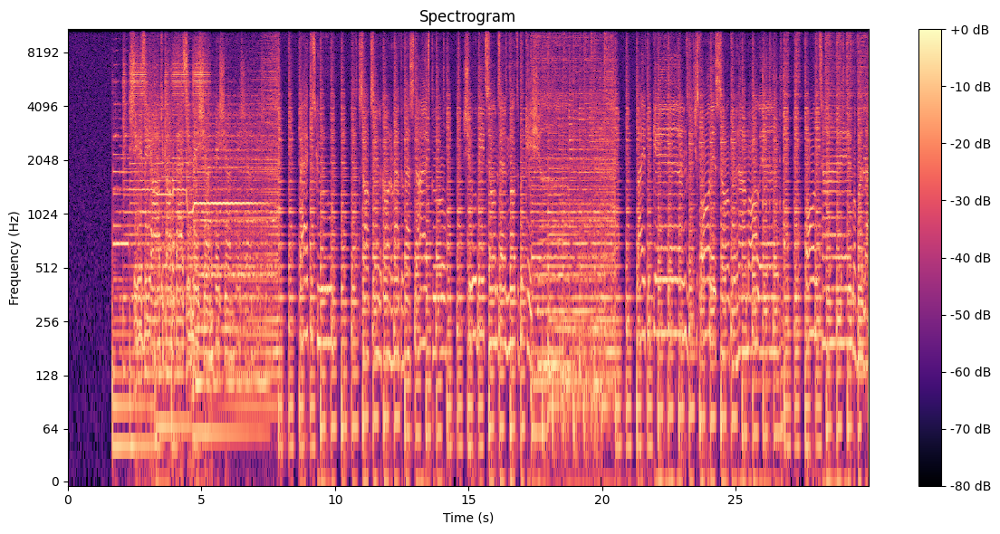

In [13]:
display_spectrogram(naive_file_path)

### Defining and Testing the Deep Learning Model

In [14]:
from typing import List, Dict, Any, Optional
import torch
import torch.nn as nn
import torch.nn.functional as F
import pytorch_lightning as pl
import numpy as np
from torch.utils.data import Dataset, DataLoader, random_split
import os
import torchaudio
import gc
import glob
import random
from torchaudio.pipelines import HDEMUCS_HIGH_MUSDB_PLUS
import psutil
import warnings
# from scripts.types import Stems, Mix
# from scripts.modeling.deep.model import Model

# Set global memory constants
MAX_AUDIO_DURATION_SECONDS = 30 # 30 seconds
SAMPLE_RATE = 44100
MAX_SAMPLES = SAMPLE_RATE * MAX_AUDIO_DURATION_SECONDS

# Set MPS fallback environment variable to handle unsupported operations
# This will allow PyTorch to fall back to CPU for unsupported operations like angle()
os.environ["PYTORCH_ENABLE_MPS_FALLBACK"] = "1"

# Check if MPS (Metal Performance Shaders) is available on macOS
def get_device():
    if torch.backends.mps.is_available():
        return torch.device("mps")
    elif torch.cuda.is_available():
        return torch.device("cuda")
    else:
        return torch.device("cpu")

# Get the device to use throughout the model
DEVICE = get_device()
print(f"Using device: {DEVICE}")
if DEVICE.type == "mps":
    print(f"MPS device detected. CPU fallback enabled for unsupported operations.")

def free_memory():
    """Aggressively free memory"""
    print("Freeing memory...")
    # Run garbage collection
    gc.collect()

    # Empty torch cache based on available device
    if torch.cuda.is_available():
        try:
            torch.cuda.empty_cache()
        except Exception as e:
            print(f"Warning: Could not clear CUDA cache: {e}")

    # Empty MPS cache with error handling
    if torch.backends.mps.is_available():
        try:
            # Just call empty_cache without setting watermark ratios
            torch.mps.empty_cache()
        except Exception as e:
            print(f"Warning: Could not clear MPS cache: {e}")

    # Empty general PyTorch memory
    for obj in gc.get_objects():
        try:
            if torch.is_tensor(obj):
                if obj.device.type != 'cpu':
                    # Move tensor to CPU to release GPU memory
                    obj.data = obj.data.to('cpu')
                    if hasattr(obj, 'grad') and obj.grad is not None:
                        obj.grad.data = obj.grad.data.to('cpu')
        except Exception:
            pass

def get_duration_str(samples):
    """Convert sample count to duration string"""
    # For numpy arrays and other sequences
    if hasattr(samples, 'shape'):
        # Get the time dimension for different tensor shapes
        if len(samples.shape) == 1:  # 1D array [time]
            sample_length = samples.shape[0]
        elif len(samples.shape) == 2:  # 2D array [batch/channel, time] or [time, channels]
            sample_length = max(samples.shape)
        elif len(samples.shape) == 3:  # 3D array with time typically in middle
            sample_length = samples.shape[1]
        elif len(samples.shape) == 4:  # 4D array with time typically 3rd dimension
            sample_length = samples.shape[2]
        else:
            sample_length = samples.size if hasattr(samples, 'size') else len(samples)
    else:
        # Simple sequence
        sample_length = len(samples)

    # Calculate duration in seconds and format
    duration_sec = sample_length / SAMPLE_RATE
    return f"{duration_sec:.2f}s ({sample_length} samples)"

class StemMixDataset(Dataset):
    def __init__(self, stems_list: List[Stems]):
        self.stems_list = stems_list
        self.target_length = MAX_SAMPLES  # 30 seconds at 44.1kHz

    def __len__(self):
        return len(self.stems_list)

    def __getitem__(self, idx):
        try:
            stems = self.stems_list[idx]
            mix = self.stems_list[idx].mixture_audio

            # Determine if audio is stereo or mono
            is_stereo = mix.ndim == 2 and mix.shape[1] == 2

            # Pad/truncate stems and mix to target length
            if is_stereo:
                # Handle stereo audio (shape: samples, 2)
                stems_tensor = torch.stack([
                    torch.from_numpy(pad_to_length(stems.bass_audio, self.target_length, stereo=True)).float(),
                    torch.from_numpy(pad_to_length(stems.drums_audio, self.target_length, stereo=True)).float(),
                    torch.from_numpy(pad_to_length(stems.other_audio, self.target_length, stereo=True)).float(),
                    torch.from_numpy(pad_to_length(stems.vocals_audio, self.target_length, stereo=True)).float()
                ])

                mix_tensor = torch.from_numpy(pad_to_length(mix, self.target_length, stereo=True)).float()

                # Reshape to [4, time, 2] for stems and [time, 2] for mix
                if stems_tensor.dim() == 3:  # [4, time*2]
                    stems_tensor = stems_tensor.view(4, self.target_length, 2)
                if mix_tensor.dim() == 1:  # [time*2]
                    mix_tensor = mix_tensor.view(self.target_length, 2)
            else:
                # Handle mono audio
                stems_tensor = torch.stack([
                    torch.from_numpy(pad_to_length(stems.bass_audio, self.target_length)).float(),
                    torch.from_numpy(pad_to_length(stems.drums_audio, self.target_length)).float(),
                    torch.from_numpy(pad_to_length(stems.other_audio, self.target_length)).float(),
                    torch.from_numpy(pad_to_length(stems.vocals_audio, self.target_length)).float()
                ])

                mix_tensor = torch.from_numpy(pad_to_length(mix, self.target_length)).float()

            # Release memory immediately
            stems._bass_audio = None
            stems._drums_audio = None
            stems._other_audio = None
            stems._vocals_audio = None
            stems._mixture_audio = None
            # Force garbage collection to free memory
            gc.collect()

            return stems_tensor, mix_tensor
        except Exception as e:
            print(f"Error processing item {idx}: {e}")
            # Return a small dummy tensor in case of error
            return (torch.zeros(4, 1000, dtype=torch.float32),
                   torch.zeros(1000, dtype=torch.float32))

def simple_mix_stems(stems):
    """Simple mean mixing of stems to create a naive mix"""
    # Check if we have stereo stems (last dimension is 2)
    if stems.dim() == 4 and stems.shape[-1] == 2:
        # Handle stereo stems - preserve stereo channels
        return stems.mean(dim=1)  # This will return [batch_size, time, 2]
    else:
        # Handle mono stems
        return stems.mean(dim=1)  # This will return [batch_size, time]

class ResourceMonitorCallback(pl.Callback):
    """Callback to monitor and log system resource usage"""
    def __init__(self, log_frequency=5):
        super().__init__()
        self.log_frequency = log_frequency
        self.last_logged_batch = -log_frequency  # Log on first batch

    def on_train_batch_end(self, trainer, pl_module, outputs, batch, batch_idx):
        # Only log every N batches to reduce overhead
        if batch_idx - self.last_logged_batch >= self.log_frequency:
            self._log_resources(pl_module)
            self.last_logged_batch = batch_idx

            # Free up memory periodically
            # free_memory()

    def on_validation_epoch_end(self, trainer, pl_module):
        self._log_resources(pl_module)

        # Force cleanup after validation
        # free_memory()

    def _log_resources(self, pl_module):
        pass
        # Log CPU usage
        # cpu_percent = psutil.cpu_percent()
        # pl_module.log('system/cpu_percent', cpu_percent, prog_bar=True)

        # Log RAM usage
        # mem = psutil.virtual_memory()
        # ram_used_gb = mem.used / (1024 ** 3)
        # ram_free_gb = mem.available / (1024 ** 3)
        # pl_module.log('system/ram_used_gb', ram_used_gb, prog_bar=True)
        # pl_module.log('system/ram_free_gb', ram_free_gb, prog_bar=True)

        # Log GPU memory if available on CUDA
        # if torch.cuda.is_available():
            # gpu_memory_used = torch.cuda.memory_allocated() / (1024 ** 3)
            #pl_module.log('system/gpu_memory_gb', gpu_memory_used, prog_bar=True)

class DeepModel(Model, pl.LightningModule):
    def __init__(self, config: Dict[str, Any] = None):
        Model.__init__(self)
        pl.LightningModule.__init__(self)

        # Default config with minimal memory usage for M2 Pro
        self.config = config or {
            'learning_rate': 1e-5,  # Lower learning rate for fine-tuning
            'batch_size': 4,  # Minimum batch size to minimize memory usage
            'num_workers': 2,
            'max_epochs': 30,
            'early_stopping_patience': 10,
            'model_save_path': '/content/drive/MyDrive/mixtastic/models/demucs_finetuned.pt',
            'segment_size': 5,  # Process in 5-second segments
            'mixed_precision': True,  # Use mixed precision training
            'gradient_checkpointing': True,  # Enable gradient checkpointing to save memory
        }

        # Get the pretrained Demucs model - we will finetune this
        bundle = HDEMUCS_HIGH_MUSDB_PLUS
        self.demucs = bundle.get_model().to(DEVICE)
        self.sample_rate = bundle.sample_rate
        # Explicitly set the model to training mode
        self.demucs.train()

        # Store the expected number of audio channels for the model
        self.expected_channels = getattr(self.demucs, 'audio_channels', 2)

        # Optimization: Enable gradient checkpointing to save memory
        if self.config.get('gradient_checkpointing', True) and hasattr(self.demucs, 'encoder'):
            print("Enabling gradient checkpointing to save memory")
            self.demucs.encoder.use_checkpoint = True

        # Don't freeze the parameters - we want to finetune them
        for param in self.demucs.parameters():
            param.requires_grad = True

        # Loss function - a combination of L1 and spectral loss
        self.l1_loss = nn.L1Loss()
        self.mse_loss = nn.MSELoss()

        # We don't initialize STFT here anymore - we create it dynamically in _spectral_loss
        # to ensure device consistency

    def _spectral_loss(self, y_pred, y_true):
        """Compute loss in the frequency domain with CPU fallback for unsupported MPS operations"""
        try:
            # Create a CPU-based STFT to ensure window and input are on same device
            # Use smaller FFT size to reduce memory usage
            cpu_stft = torchaudio.transforms.Spectrogram(
                n_fft=2048,  # Reduced from 4096 to save memory
                hop_length=512,  # Reduced from 1024 to save memory
                power=None,
            ).to("cpu")

            # Move to CPU for operations not supported on MPS (specifically angle calculation)
            # Note: we don't use detach() so gradients can still flow back
            cpu_device = torch.device("cpu")
            # Use clone() to avoid modifying the original tensor
            y_pred_cpu = y_pred.clone().to(cpu_device)
            y_true_cpu = y_true.clone().to(cpu_device)

            # Handle multi-channel audio (stereo)
            if y_pred_cpu.dim() == 3 and y_true_cpu.dim() == 3:
                # Check if the last dimension is the channel dimension (batch, time, channel)
                if y_pred_cpu.shape[-1] <= 2:  # Assuming 1 or 2 channels
                    # Compute loss separately for each channel then average
                    batch_size, time_len, channels = y_pred_cpu.shape
                    total_loss = 0

                    for ch in range(channels):
                        # Extract single channel
                        y_pred_ch = y_pred_cpu[..., ch]
                        y_true_ch = y_true_cpu[..., ch]

                        # Compute spectral loss for this channel - using local CPU STFT
                        spec_pred = cpu_stft(y_pred_ch)
                        spec_true = cpu_stft(y_true_ch)

                        # Magnitude loss
                        mag_pred = torch.abs(spec_pred)
                        mag_true = torch.abs(spec_true)
                        mag_loss = F.mse_loss(mag_pred, mag_true)

                        # Phase loss (less weight as it's harder to predict perfectly)
                        phase_pred = torch.angle(spec_pred)  # This operation uses CPU fallback
                        phase_true = torch.angle(spec_true)
                        phase_loss = 0.1 * F.mse_loss(phase_pred, phase_true)

                        # Add to total
                        total_loss += mag_loss + phase_loss

                        # Clear variables to save memory
                        del spec_pred, spec_true, mag_pred, mag_true, phase_pred, phase_true

                    # Average across channels
                    total_loss = total_loss / channels

                    # Move result back to original device for backward pass
                    return total_loss.to(y_pred.device)

            # Handle mono or other tensor shapes
            spec_pred = cpu_stft(y_pred_cpu)
            spec_true = cpu_stft(y_true_cpu)

            # Magnitude loss
            mag_pred = torch.abs(spec_pred)
            mag_true = torch.abs(spec_true)
            mag_loss = F.mse_loss(mag_pred, mag_true)

            # Phase loss (less weight as it's harder to predict perfectly)
            phase_pred = torch.angle(spec_pred)
            phase_true = torch.angle(spec_true)
            phase_loss = 0.1 * F.mse_loss(phase_pred, phase_true)

            # Clear large variables to save memory
            del spec_pred, spec_true, mag_pred, mag_true, phase_pred, phase_true

            # Move the final loss back to the original device for backward pass
            total_loss = (mag_loss + phase_loss).to(y_pred.device)

            return total_loss

        except Exception as e:
            # If spectral loss fails, log the error and fall back to L1 loss
            print(f"Error in spectral loss calculation: {e}")
            print("Falling back to L1 loss only")
            return self.l1_loss(y_pred, y_true)

    def process_segment(self, stems_segment):
        """
        Process one segment through the finetuned Demucs pipeline:
        1. Simple mix stems
        2. Separate with Demucs
        3. Mix the Demucs output stems
        """
        # Create a simple mix from stems
        naive_mix = simple_mix_stems(stems_segment)  # [batch_size, time]

        # Check if the naive_mix is stereo (has an extra dimension)
        if naive_mix.dim() == 3:  # [batch_size, time, 2] (stereo)
            # Convert stereo to mono by averaging channels
            naive_mix = naive_mix.mean(dim=-1)  # [batch_size, time]

        # Add channel dimension for Demucs
        naive_mix = naive_mix.unsqueeze(1)  # [batch_size, 1, time]

        # Check if we need to adjust the number of channels for Demucs
        if naive_mix.shape[1] != self.expected_channels:
            # If we have 1 channel but need more, repeat the channel
            if naive_mix.shape[1] == 1 and self.expected_channels > 1:
                naive_mix = naive_mix.repeat(1, self.expected_channels, 1)

        # Clean up memory before heavy computation
        # free_memory()

        # Get the improved stems through Demucs
        # Demucs outputs a tensor of shape [batch_size, sources=4, time]
        improved_stems = self.demucs(naive_mix)

        # Mix the improved stems to get the final output
        final_mix = simple_mix_stems(improved_stems)  # [batch_size, time]

        # Ensure the final_mix is exactly MAX_SAMPLES long
        if final_mix.shape[-1] != MAX_SAMPLES:
            # Convert to numpy, pad/truncate, then back to tensor
            final_mix_np = final_mix.cpu().numpy()
            final_mix_np = np.array([pad_to_length(mix, MAX_SAMPLES) for mix in final_mix_np])
            final_mix = torch.from_numpy(final_mix_np).to(final_mix.device).float()

        # Also ensure naive_mix is standardized
        naive_mix = naive_mix.squeeze(1)
        if naive_mix.shape[-1] != MAX_SAMPLES:
            naive_mix_np = naive_mix.cpu().numpy()
            naive_mix_np = np.array([pad_to_length(mix, MAX_SAMPLES) for mix in naive_mix_np])
            naive_mix = torch.from_numpy(naive_mix_np).to(naive_mix.device).float()

        return final_mix, naive_mix, improved_stems

    def forward(self, stems):
        """
        Forward pass through the model

        Args:
            stems: Tensor of shape [batch_size, num_stems=4, time] or [batch_size, num_stems=4, time, 2] for stereo

        Returns:
            final_mix: Tensor of shape [batch_size, time] or [batch_size, time, 2] for stereo
            naive_mix: Tensor of shape [batch_size, time] or [batch_size, time, 2] for stereo
            improved_stems: Tensor of shape [batch_size, 4, time] or [batch_size, 4, time, 2] for stereo
        """
        # Check if input is stereo (has extra dimension)
        is_stereo = stems.dim() == 4 and stems.shape[-1] == 2

        # If stereo, we need to convert to mono for demucs processing
        if is_stereo:
            # Keep original stereo stems for later
            original_stereo_stems = stems.clone()

            # Convert to mono by averaging channels
            stems = stems.mean(dim=-1)  # now [batch_size, num_stems=4, time]

        # Process segments with Demucs (which expects mono audio)
        final_mix, naive_mix, improved_stems = self.process_segment(stems)

        # From the logs, we see these shapes are already correct:
        # final_mix: [batch, channels, time]
        # naive_mix: [batch, channels, time]
        # improved_stems: [batch, sources, channels, time]

        return final_mix, naive_mix, improved_stems

    def training_step(self, batch, batch_idx):
        """Training step for Lightning"""
        stems, target_mix = batch

        # Process stems through our pipeline
        final_mix, naive_mix, improved_stems = self(stems)

        # Reshape if necessary to match dimensions
        # final_mix shape is [batch, channels, time] while target_mix is [batch, time, channels]
        if final_mix.dim() == 3 and target_mix.dim() == 3:
            # Check if channels are in different positions
            if final_mix.shape[1] == target_mix.shape[2]:
                # Need to permute final_mix to match target_mix
                final_mix = final_mix.permute(0, 2, 1)  # [batch, time, channels]
                naive_mix = naive_mix.permute(0, 2, 1)  # [batch, time, channels]

        # Calculate losses
        # Time domain loss for final mix vs target
        time_loss = self.l1_loss(final_mix, target_mix)

        # Frequency domain loss for better spectral characteristics
        spec_loss = self._spectral_loss(final_mix, target_mix)

        # Combined loss
        total_loss = time_loss + spec_loss

        # Optional: Add regularization to keep improvements subtle
        if self.config.get('regularize_changes', True):
            # Add loss to ensure improved stems aren't too different from input stems
            # Need to reshape improved_stems to match original stems dimensions
            if improved_stems.dim() == 4 and stems.dim() == 4:
                # improved_stems is [batch, sources, channels, time]
                # stems is [batch, sources, time, channels]
                improved_stems_reshaped = improved_stems.permute(0, 1, 3, 2)  # [batch, sources, time, channels]
                stem_diff_loss = 0.1 * self.l1_loss(improved_stems_reshaped, stems)
            else:
                stem_diff_loss = 0.1 * self.l1_loss(improved_stems, stems)

            total_loss += stem_diff_loss
            self.log('train_stem_diff_loss', stem_diff_loss)

        # Calculate improvement over naive mix
        naive_loss = self.l1_loss(naive_mix, target_mix)
        improvement = naive_loss - time_loss

        # Log metrics
        self.log('train_loss', total_loss, prog_bar=True)
        self.log('train_time_loss', time_loss)
        self.log('train_spec_loss', spec_loss)
        self.log('train_naive_loss', naive_loss)
        self.log('train_improvement', improvement, prog_bar=True)

        # Log current learning rate
        opt = self.optimizers()
        if opt is not None:
            current_lr = opt.param_groups[0]['lr']
            self.log('learning_rate', current_lr, prog_bar=True)

        # Clean up memory after each step
        # free_memory()

        # Clear references to large tensors to free memory
        del final_mix, naive_mix, improved_stems

        return total_loss

    def validation_step(self, batch, batch_idx):
        """Validation step for Lightning"""
        stems, target_mix = batch

        # Process stems through our pipeline
        final_mix, naive_mix, improved_stems = self(stems)

        # Reshape if necessary to match dimensions
        # final_mix shape is [batch, channels, time] while target_mix is [batch, time, channels]
        if final_mix.dim() == 3 and target_mix.dim() == 3:
            # Check if channels are in different positions
            if final_mix.shape[1] == target_mix.shape[2]:
                # Need to permute final_mix to match target_mix
                final_mix = final_mix.permute(0, 2, 1)  # [batch, time, channels]
                naive_mix = naive_mix.permute(0, 2, 1)  # [batch, time, channels]

        # Calculate losses
        time_loss = self.l1_loss(final_mix, target_mix)
        spec_loss = self._spectral_loss(final_mix, target_mix)
        total_loss = time_loss + spec_loss

        # Calculate improvement over naive mix
        naive_loss = self.l1_loss(naive_mix, target_mix)
        improvement = naive_loss - time_loss

        # Log metrics
        self.log('val_loss', total_loss, prog_bar=True)
        self.log('val_time_loss', time_loss)
        self.log('val_spec_loss', spec_loss)
        self.log('val_naive_loss', naive_loss)
        self.log('val_improvement', improvement, prog_bar=True)

        # Clean up memory after validation step
        # free_memory()

        # Clear references to large tensors to free memory
        del final_mix, naive_mix, improved_stems

        return total_loss

    def configure_optimizers(self):
        """Configure optimizers for Lightning"""
        # Use AdamW optimizer for better regularization
        optimizer = torch.optim.AdamW(
            self.parameters(),
            lr=self.config.get('learning_rate', 1e-5),
            weight_decay=1e-5
        )

        # Learning rate scheduler
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
            optimizer,
            mode='min',
            factor=0.5,
            patience=5,
            verbose=False  # Disable verbose output to avoid warnings
        )

        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler,
                'monitor': 'val_loss',
                'interval': 'epoch',
                'frequency': 1
            }
        }

    def fit(self, train_stems: List[Stems], val_stems: List[Stems]):
        """Custom fit method that sets up Lightning trainer"""
        # Create dataset
        train_dataset = StemMixDataset(train_stems)
        val_dataset = StemMixDataset(val_stems)
        train_size = len(train_stems)
        val_size = len(val_stems)

        # Create data loaders with appropriate worker settings
        batch_size = self.config.get('batch_size', 1)
        use_persistent_workers = batch_size > 1  # Only use persistent workers if batch size > 1

        train_loader = DataLoader(
            train_dataset,
            batch_size=batch_size,
            shuffle=True,
            num_workers=self.config.get('num_workers', 2),
            pin_memory=True,
            persistent_workers=use_persistent_workers  # Use persistent workers if batch size > 1
        )

        val_loader = DataLoader(
            val_dataset,
            batch_size=batch_size,
            shuffle=False,
            num_workers=self.config.get('num_workers', 2),
            pin_memory=True,
            persistent_workers=use_persistent_workers  # Use persistent workers if batch size > 1
        )

        # Set up trainer - use MPS for Apple Silicon GPU
        trainer_kwargs = {
            'max_epochs': self.config.get('max_epochs', 50),
            'callbacks': [
                pl.callbacks.EarlyStopping(
                    monitor='val_loss',
                    patience=self.config.get('early_stopping_patience', 10),
                    mode='max'  # We want to minimize validation loss
                ),
                pl.callbacks.ModelCheckpoint(
                    monitor='val_loss',
                    dirpath='/content/drive/MyDrive/mixtastic/models/checkpoints/',
                    filename='demucs-{epoch:02d}-{val_loss:.4f}',
                    save_top_k=3,
                    mode='max'
                ),
                # Add resource monitoring callback
                ResourceMonitorCallback(log_frequency=1)  # Check every batch for memory issues
            ],
            'accelerator': 'mps' if torch.backends.mps.is_available() else ('gpu' if torch.cuda.is_available() else 'cpu'),
            'devices': 1,
            'enable_progress_bar': True,
            'logger': pl.loggers.TensorBoardLogger('logs/', name='demucs'),
            'log_every_n_steps': 1,  # Log every batch since we have few batches
            'gradient_clip_val': 1.0,  # Prevent instability
            'accumulate_grad_batches': 8  # Increased from 4 to 8 to save memory
        }

        # Add mixed precision if requested (significantly speeds up training)
        if self.config.get('mixed_precision', True) and (torch.cuda.is_available() or torch.backends.mps.is_available()):
            # Note: MPS doesn't fully support mixed precision yet, but we'll keep it for future compatibility
            trainer_kwargs['precision'] = '16-mixed'

        trainer = pl.Trainer(**trainer_kwargs)

        print(f"Starting training with {train_size} training samples and {val_size} validation samples")
        print(f"Training with batch size {self.config.get('batch_size', 1)}, {self.config.get('num_workers', 1)} worker thread")
        print(f"Accumulating gradients over {trainer_kwargs['accumulate_grad_batches']} batches")
        print(f"Using accelerator: {trainer_kwargs['accelerator']}")
        print(f"Gradient checkpointing: {'enabled' if self.config.get('gradient_checkpointing', False) else 'disabled'}")

        # Clean up before training
        # free_memory()

        # Try training with aggressive memory management
        try:
            # Train model
            trainer.fit(self, train_loader, val_loader)

            # Save final model
            self.save()
        except Exception as e:
            print(f"Error during training: {e}")
            # Try to save model anyway
            try:
                self.save()
                print("Saved model despite error")
            except:
                print("Could not save model")

        return self

    def predict(self, X: List[Stems]) -> List[Mix]:
        """Generate predictions for new stems"""
        result_mixes = []

        # Create a temporary dataset for prediction
        temp_dataset = StemMixDataset(X)

        predict_loader = DataLoader(
            temp_dataset,
            batch_size=4,  # Process one at a time to save memory
            shuffle=False,
            num_workers=4,  # Minimize workers for prediction
            pin_memory=True
        )

        # Set model to evaluation mode
        self.eval()

        # No gradient tracking needed for prediction
        with torch.no_grad():
            for i, (stems, target_mix) in enumerate(predict_loader):
                try:
                    # Move to same device as model
                    stems = stems.to(DEVICE)

                    # Get model prediction
                    final_mix, _, _ = self(stems)

                    # Handle the returned shape [batch, channels, time]
                    # Convert to numpy array
                    if final_mix.dim() == 3:  # [batch, channels, time]
                        # If stereo (2 channels), convert to expected format
                        if final_mix.shape[1] == 2:
                            # Permute to [batch, time, channels]
                            final_mix = final_mix.permute(0, 2, 1)

                    # Convert to numpy and append to results
                    mix_array = final_mix[0].cpu().numpy()

                    # Ensure all output mixes are exactly 30 seconds
                    if len(mix_array) != MAX_SAMPLES:
                        mix_array = pad_to_length(mix_array, MAX_SAMPLES)

                    result_mixes.append(mix_array)

                    # Clean up memory after each prediction
                    del final_mix, stems
                    # free_memory()

                except Exception as e:
                    print(f"Error processing item {i}: {e}")
                    # Add a silent audio segment as fallback
                    if target_mix.dim() == 2:  # Stereo
                        fallback = np.zeros((MAX_SAMPLES, 2), dtype=np.float32)
                    else:  # Mono
                        fallback = np.zeros(MAX_SAMPLES, dtype=np.float32)
                    result_mixes.append(fallback)

        naive_model = NaiveModel()
        naive_mixes = naive_model.predict(X)
        for i, result_mix in enumerate(result_mixes):
            naive_mix = pad_to_length(naive_mixes[i], MAX_SAMPLES, stereo=True)
            result_mixes[i] = blend(result_mix, naive_mix, -6, -12)
        return result_mixes

    def save(self):
        """Save model to disk"""
        save_path = self.config.get('model_save_path', '/content/drive/MyDrive/mixtastic/models/demucs_finetuned.pt')

        # Ensure directory exists
        os.makedirs(os.path.dirname(save_path), exist_ok=True)

        # Make sure model is on CPU before saving
        cpu_state_dict = {k: v.cpu() for k, v in self.state_dict().items()}

        # Save model state dict
        torch.save({
            'model_state_dict': cpu_state_dict,
            'config': self.config
        }, save_path)

        print(f"Model saved to {save_path}")

    @classmethod
    def load(cls, model_path: str, config = None) -> 'DeepModel':
        """Load model from disk"""
        checkpoint = torch.load(model_path, map_location='cpu')

        model_config = config or checkpoint.get('config', {})

        # Create model instance
        model = cls(model_config)

        # Load state dict
        model.load_state_dict(checkpoint['model_state_dict'])

        # Move model to correct device
        model = model.to(DEVICE)

        return model

Using device: cuda


In [15]:
def load_data(data_dir, max_songs=None):
    """Load songs from a directory, optionally limiting the number"""
    stems_list = []

    # Find all song directories
    song_dirs = glob.glob(os.path.join(data_dir, "*"))

    if max_songs:
        # Randomly sample if max_songs is specified
        if len(song_dirs) > max_songs:
            song_dirs = random.sample(song_dirs, max_songs)

    for song_dir in song_dirs:
        try:
            stems = Stems(song_dir)
            stems_list.append(stems)

            # Release memory after appending
            gc.collect()

        except Exception as e:
            print(f"Error loading {song_dir}: {e}")

    print(f"Loaded {len(stems_list)} songs successfully")
    return stems_list

def train_deep_model():
    """Standalone training script for the DeepModel.

    Loads songs from data/processed/train directory,
    uses 80 songs for training and 10 for validation.
    """
    # Configuration for training
    config = {
        'learning_rate': 1e-5,
        'batch_size': 3,
        'num_workers': 4,
        'max_epochs': 100,
        'early_stopping_patience': 10,
        'model_save_path': '/content/drive/MyDrive/mixtastic/models/demucs_finetuned.pt',
        'segment_size': 5,
        'mixed_precision': True,
        'gradient_checkpointing': True
    }

    # Load songs data
    print("Loading song data from /content/drive/MyDrive/mixtastic/processed...")
    train_stems_list = load_data('/content/drive/MyDrive/mixtastic/processed/train')
    val_stems_list = load_data('/content/drive/MyDrive/mixtastic/processed/valid')

    if len(train_stems_list) == 0:
        print("Error: No songs found in /content/drive/MyDrive/mixtastic/processed/train directory")
        return

    if len(val_stems_list) == 0:
        print("Error: No songs found in /content/drive/MyDrive/mixtastic/processed/valid directory")
        return

    print(f"Loaded {len(train_stems_list)} songs from train and {len(val_stems_list)} songs from valid")

    # Create and train the model
    model = DeepModel.load('/content/drive/MyDrive/mixtastic/models/demucs_finetuned.pt', config)

    # Train the model using the fit method
    # The fit method already handles the train/validation split
    print("Starting model training...")
    model.fit(train_stems_list, val_stems_list)

    print("Training complete! Model saved to:", config['model_save_path'])

# train_deep_model()
print('Skipping training.')

Skipping training.


In [16]:
deep_path = '/content/test_deep.wav'
deep_model = DeepModel.load('/content/drive/MyDrive/mixtastic/models/demucs_finetuned.pt')
test_model(deep_model, deep_path)

import IPython.display as ipd
import numpy as np

# Load audio file
ipd.Audio(deep_path)

100%|██████████| 319M/319M [00:01<00:00, 326MB/s]


Loading stems from /content/drive/MyDrive/mixtastic/processed/test/Al James - Schoolboy Facination AUG1...
Running prediction with NaiveModel...
Saving mix to /content/test_deep.wav...
Writing with sample rate 44100
Done! Mix saved to /content/test_deep.wav


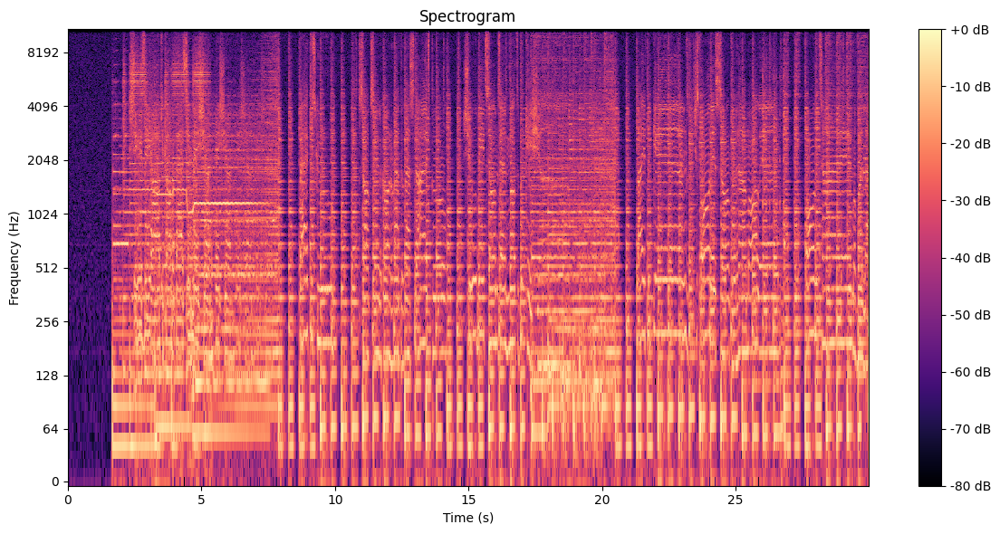

In [17]:
display_spectrogram(deep_path)